# 05 — Grad-CAM Analysis

Grad-CAM is used to visualize the image regions that contribute to the EfficientNet-B0 classification decision.

The analysis helps evaluate whether the model focuses on meaningful regions associated with obstacles and clear road scenes.

In [1]:
# Imports
import os
import pandas as pd
import torch 
import matplotlib.pyplot as plt

In [2]:
!git clone https://github.com/gracyy-rm/autonomous-binary-classifier.git

Cloning into 'autonomous-binary-classifier'...
remote: Enumerating objects: 537, done.
remote: Counting objects: 100% (39/39), done.
remote: Compressing objects: 100% (30/30), done.
remote: Total 537 (delta 19), reused 25 (delta 9), pack-reused 498 (from 2)
Receiving objects: 100% (537/537), 268.99 MiB | 31.92 MiB/s, done.
Resolving deltas: 100% (288/288), done.
Updating files: 100% (60/60), done.


In [3]:
os.chdir("/kaggle/working/autonomous-binary-classifier")

In [4]:
from src.model import create_model
from src.gradcam import GradCAM

## Load Selected Model

The EfficientNet-B0 checkpoint selected during model comparison is loaded for Grad-CAM analysis.

In [5]:
EXPERIMENTS_DIR = "/kaggle/input/datasets/gracyyadav79/experiments-models"

MODEL_PATH = os.path.join(
    EXPERIMENTS_DIR,
    "efficientnet_experiment",
    "efficientnet_b0_lr0.001_bs128_20260810_071818",
    "best_model_acc_91.5.pth"
)

In [6]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [7]:
checkpoint = torch.load(MODEL_PATH,map_location=device)

In [8]:
model=create_model(
    model_name=checkpoint["architecture"],
    num_classes=1,
    freeze_backbone=False
)

Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth


100%|██████████| 20.5M/20.5M [00:00<00:00, 123MB/s] 


In [9]:
model.load_state_dict(checkpoint["state_dict"])
model.to(device)

AutonomousClassifier(
  (backbone): EfficientNet(
    (features): Sequential(
      (0): Conv2dNormActivation(
        (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): SiLU(inplace=True)
      )
      (1): Sequential(
        (0): MBConv(
          (block): Sequential(
            (0): Conv2dNormActivation(
              (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
              (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
              (2): SiLU(inplace=True)
            )
            (1): SqueezeExcitation(
              (avgpool): AdaptiveAvgPool2d(output_size=1)
              (fc1): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
              (fc2): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
              (activation): SiLU(inplace=True)
            

In [10]:
model.eval()

AutonomousClassifier(
  (backbone): EfficientNet(
    (features): Sequential(
      (0): Conv2dNormActivation(
        (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): SiLU(inplace=True)
      )
      (1): Sequential(
        (0): MBConv(
          (block): Sequential(
            (0): Conv2dNormActivation(
              (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
              (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
              (2): SiLU(inplace=True)
            )
            (1): SqueezeExcitation(
              (avgpool): AdaptiveAvgPool2d(output_size=1)
              (fc1): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
              (fc2): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
              (activation): SiLU(inplace=True)
            

In [11]:
print(f"Model: {checkpoint['architecture']}")
print(f"Device: {device}")

Model: efficientnet_b0
Device: cpu


## Grad-CAM Target Layer

The final convolutional feature block of EfficientNet-B0 is selected as the Grad-CAM target layer. This layer provides high-level spatial features while retaining meaningful localization information.

In [12]:
target_layer = model.backbone.features[-1]

print(target_layer)

Conv2dNormActivation(
  (0): Conv2d(320, 1280, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (1): BatchNorm2d(1280, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): SiLU(inplace=True)
)


In [13]:
INFERENCE_RESULTS="/kaggle/input/datasets/gracyyadav79/results/efficientnet_b0_inference_results.csv"

In [14]:
predictions_df=pd.read_csv(INFERENCE_RESULTS)

In [15]:
print(f"Total Predictions: {len(predictions_df)}")

Total Predictions: 514


In [16]:
predictions_df.head(4)

,image_path,image_name,raw_logit,raw_prob,pred_label,pred_class_name,confidence_score,is_uncertain
0,/kaggle/input/datasets/gracyyadav79/data-2k-50...,9bc0e5c8-0cb9683d.jpg,22.3425,1.0,1,Obstacle,100.0,False
1,/kaggle/input/datasets/gracyyadav79/data-2k-50...,b7226661-33b4c4ff.jpg,13.5993,1.0,1,Obstacle,100.0,False
2,/kaggle/input/datasets/gracyyadav79/data-2k-50...,c6728701-f427d429.jpg,10.2992,1.0,1,Obstacle,100.0,False
3,/kaggle/input/datasets/gracyyadav79/data-2k-50...,a279854d-162bd02c.jpg,21.8656,1.0,1,Obstacle,100.0,False


In [17]:
inference_df = pd.read_csv("/kaggle/input/datasets/gracyyadav79/inference-data/inference.csv")

In [18]:
print(f"total inference data : {len(inference_df)}" )

total inference data : 514


## Grad-CAM Visualization

Grad-CAM visualizations are generated for representative predictions to examine the regions influencing the model's decisions.

## **Obstacle**

GRAD-CAM INSPECTION: OBSTACLE PREDICTIONS (318 images)


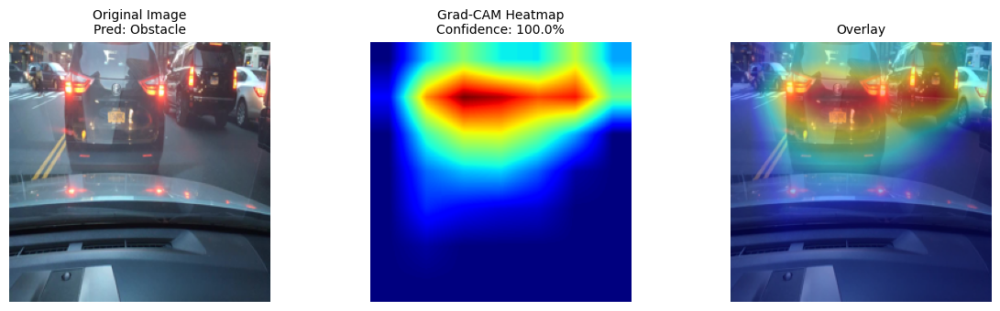

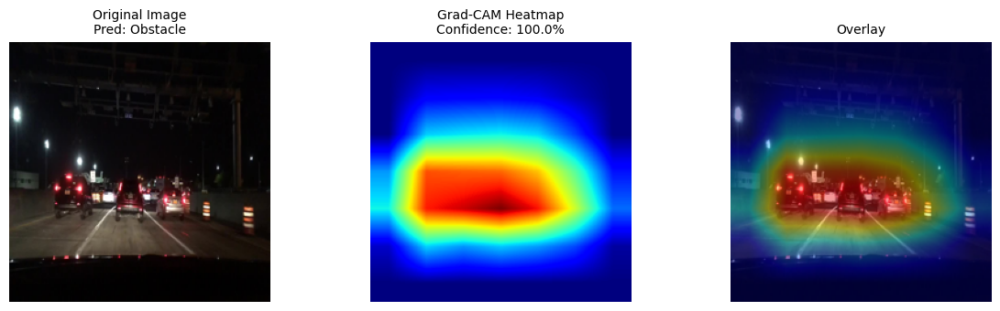

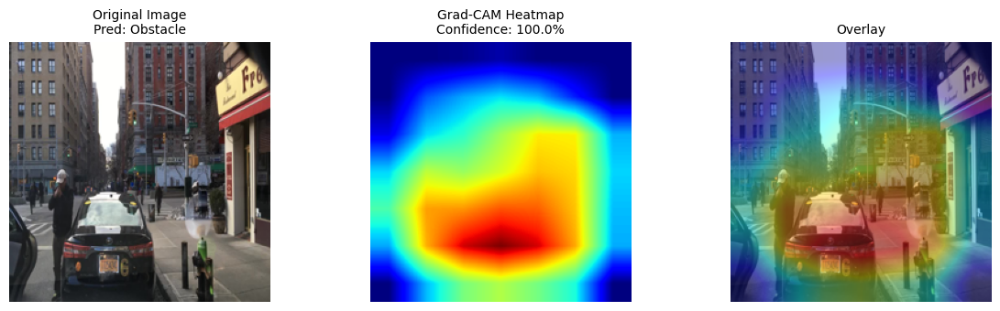

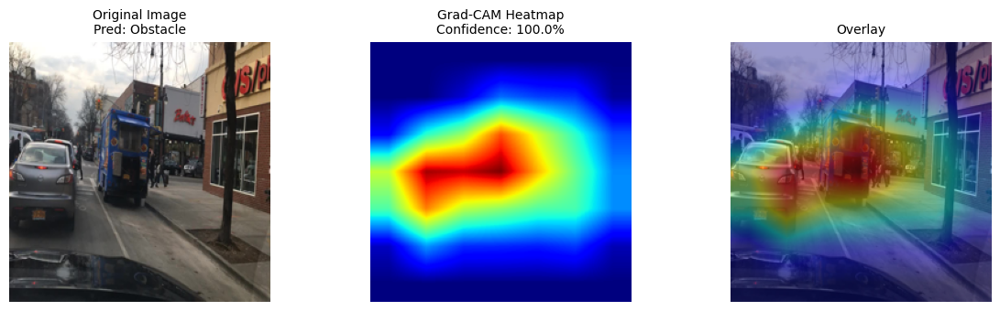

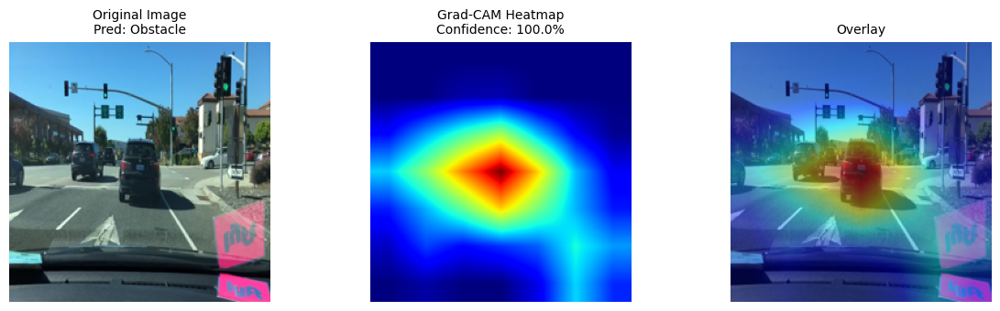

In [19]:
obstacle_df = predictions_df[
    predictions_df["pred_label"] == 1
]

GradCAM.inspect_single_df(
    df=obstacle_df,
    df_name="Obstacle Predictions",
    model=model,
    model_name="efficientnet_b0",
    device=device,
    num_samples=5
)

## **High Confidence Obsatcle Predictions**

GRAD-CAM INSPECTION: HIGH CONFIDENCE OBSTACLE (5 images)


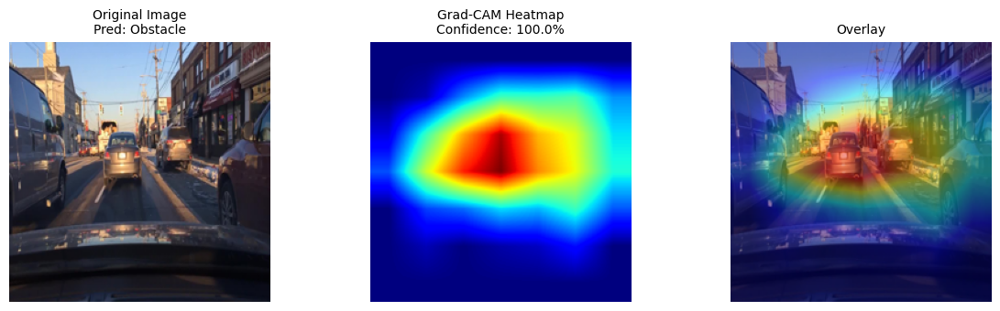

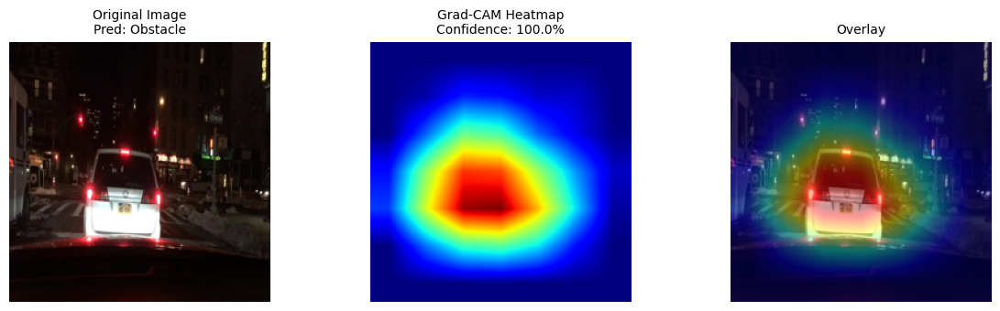

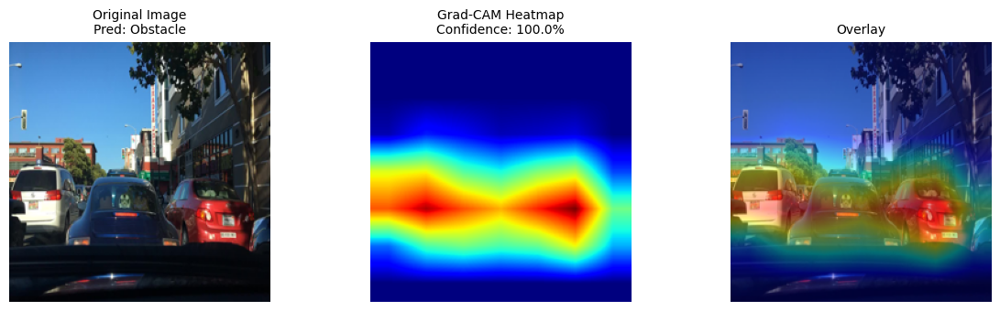

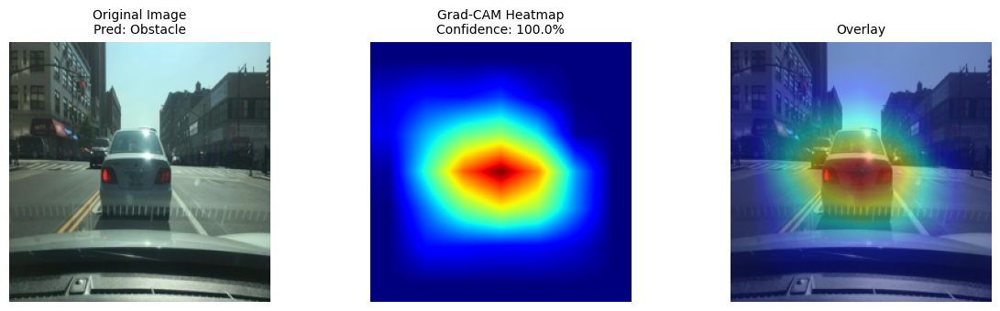

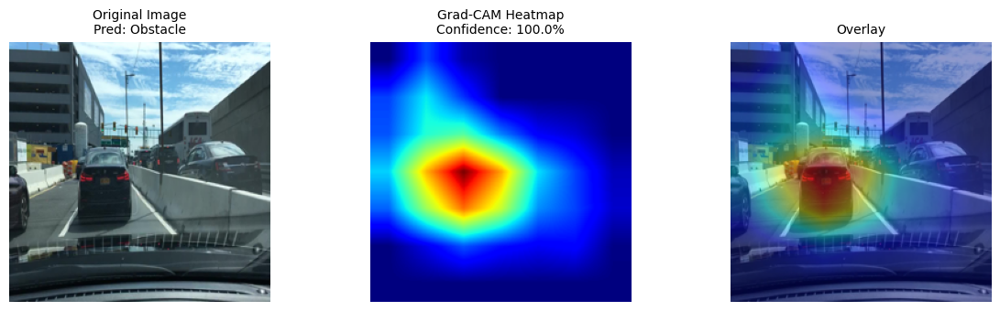

In [20]:
high_conf_obstacle_df = (
    predictions_df[predictions_df["pred_label"] == 1]
    .sort_values("confidence_score", ascending=False)
    .head(5)
)

GradCAM.inspect_single_df(
    df=high_conf_obstacle_df,
    df_name="High Confidence Obstacle",
    model=model,
    model_name="efficientnet_b0",
    device=device,
    num_samples=5
)

### **Analysis** :
The Grad-CAM visualizations for high-confidence obstacle predictions are examined to determine whether the model focuses on relevant objects or regions associated with obstacles.

The model generally focuses on the visually important regions contributing to the obstacle prediction. This provides evidence that the model is learning meaningful spatial features rather than relying entirely on irrelevant background information.

## **NO Obstacle**

GRAD-CAM INSPECTION: NO OBSTACLE PREDICTIONS (196 images)


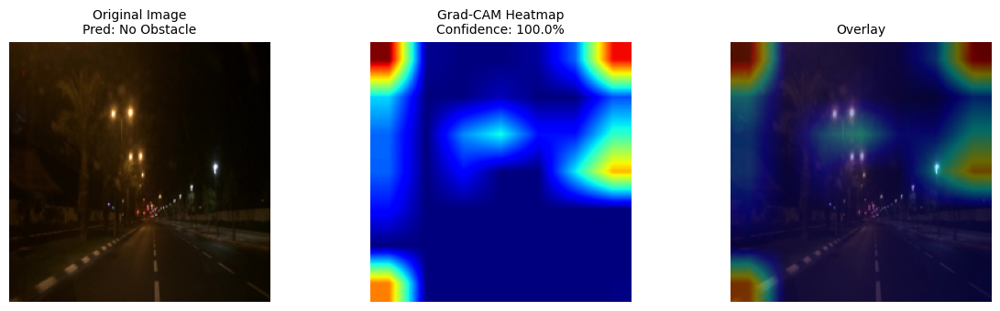

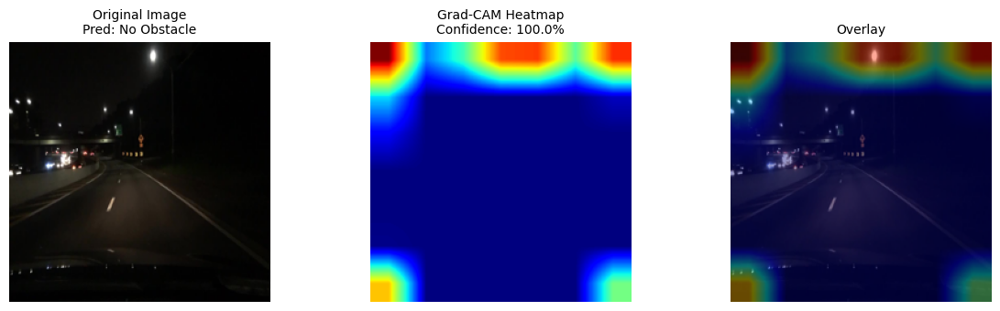

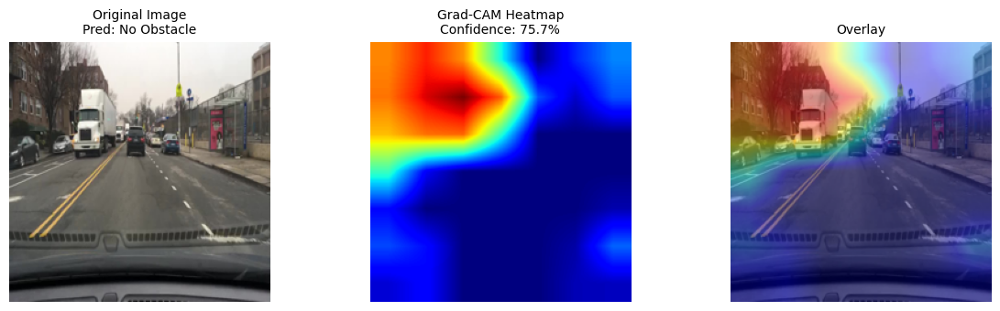

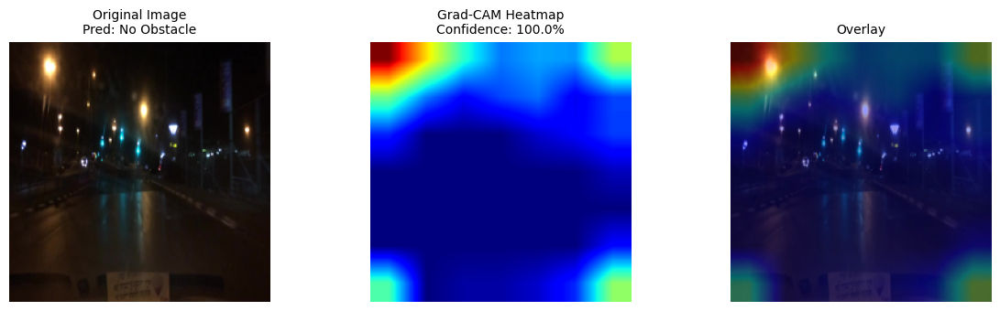

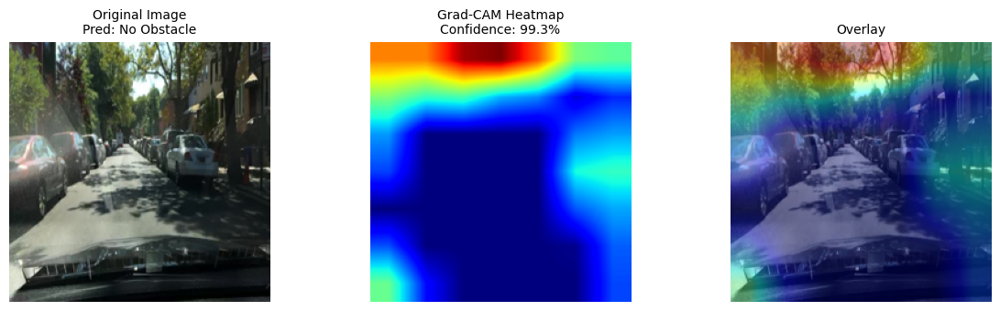

In [21]:
no_obstacle_df = predictions_df[
    predictions_df["pred_label"] == 0
]

GradCAM.inspect_single_df(
    df=no_obstacle_df,
    df_name="No Obstacle Predictions",
    model=model,
    model_name="efficientnet_b0",
    device=device,
    num_samples=5
)

## **High-Confidence No-Obstacle Predictions**

GRAD-CAM INSPECTION: HIGH CONFIDENCE NO OBSTACLE (5 images)


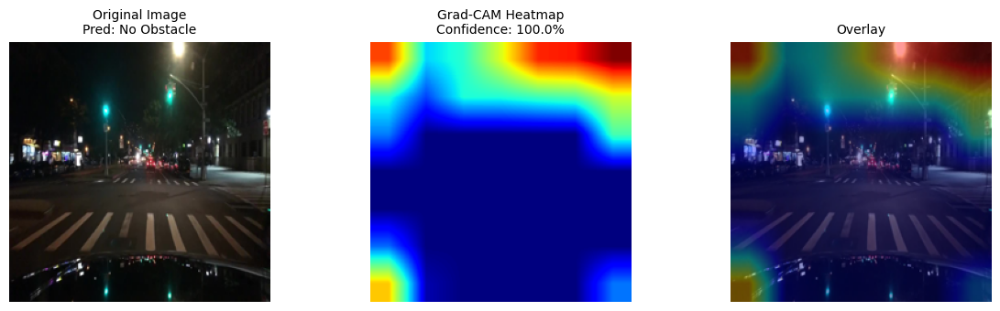

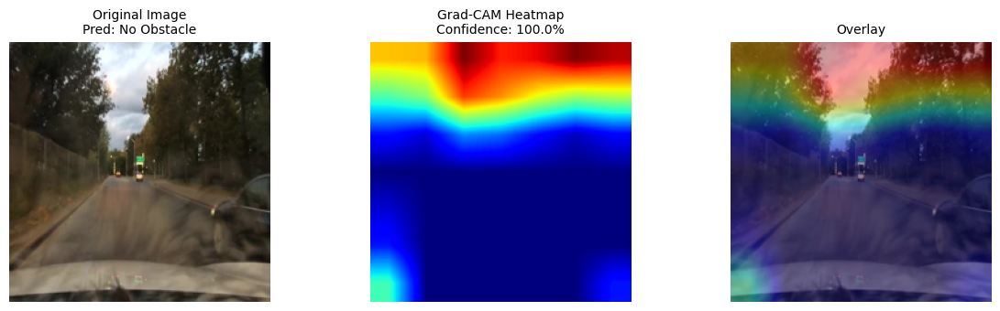

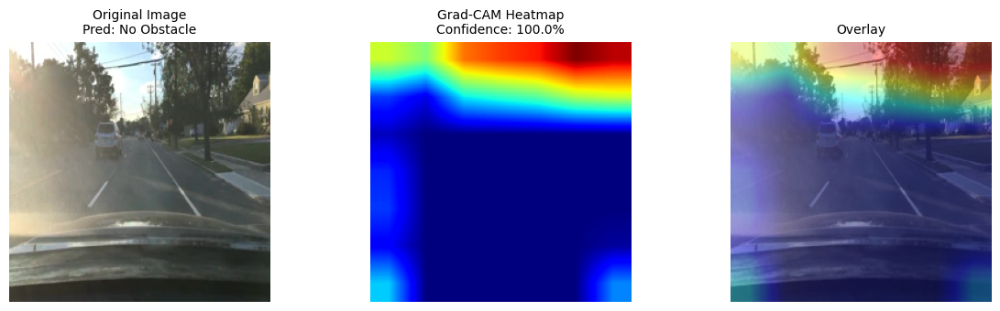

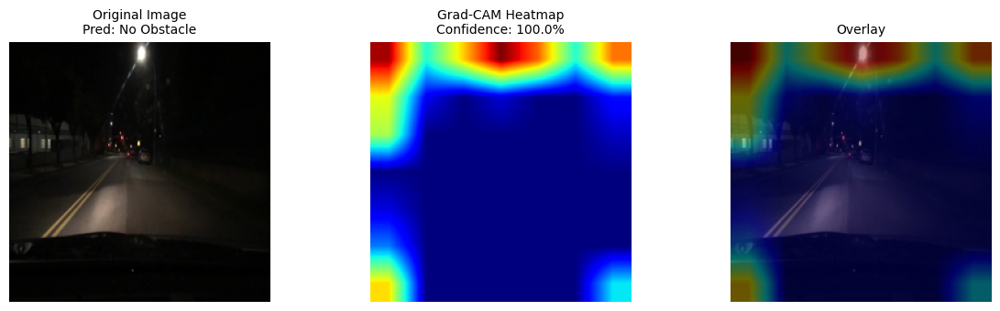

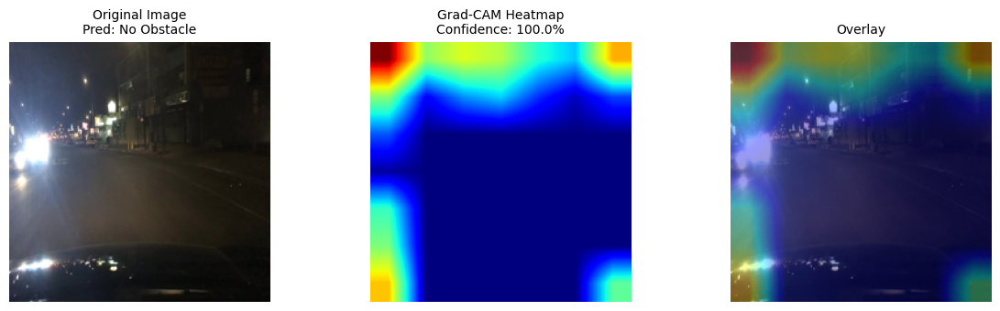

In [22]:
high_conf_no_obstacle_df = (
    predictions_df[predictions_df["pred_label"] == 0]
    .sort_values("confidence_score", ascending=False)
    .head(5)
)

GradCAM.inspect_single_df(
    df=high_conf_no_obstacle_df,
    df_name="High Confidence No Obstacle",
    model=model,
    model_name="efficientnet_b0",
    device=device,
    num_samples=5
)

### **Analysis**:
The Grad-CAM visualizations for high-confidence no-obstacle predictions are analyzed to determine which regions contribute to the model's decision that the scene is clear.

The visualizations show the regions receiving the strongest activation for these predictions. The results provide insight into whether the model is primarily using road and scene structure or other visual cues when identifying no-obstacle cases.

## **Uncertain Predictions**

Grad-CAM is also applied to low-confidence predictions to investigate whether the model's uncertainty is associated with ambiguous or visually challenging regions.

In [23]:
uncertain_df = predictions_df[predictions_df["is_uncertain"]]
print(f"Uncertain predictions: {len(uncertain_df)}")

Uncertain predictions: 13


GRAD-CAM INSPECTION: UNCERTAIN PREDICTIONS (13 images)


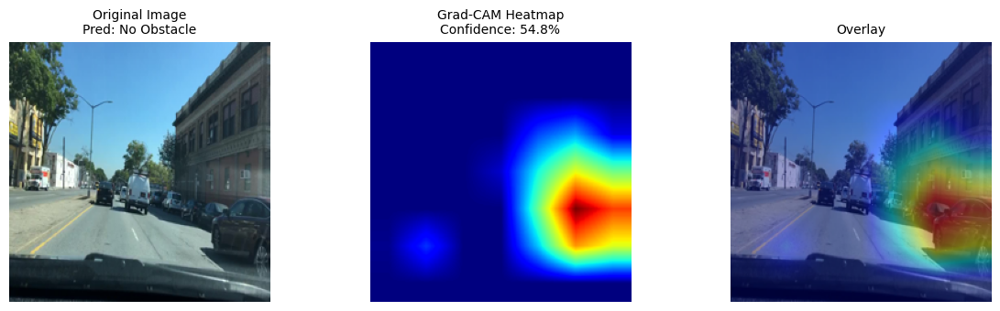

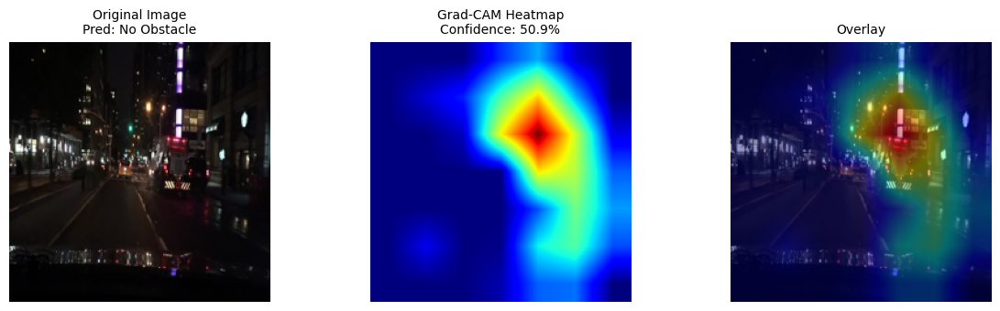

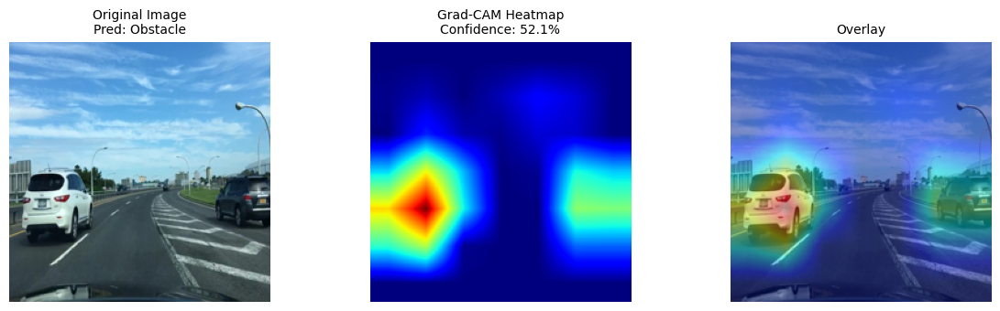

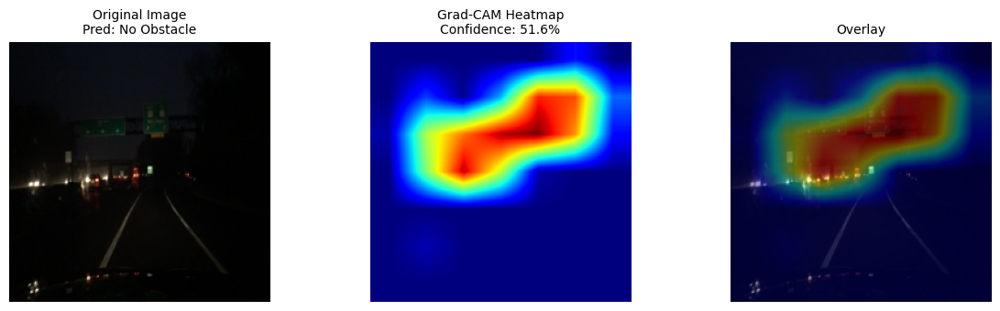

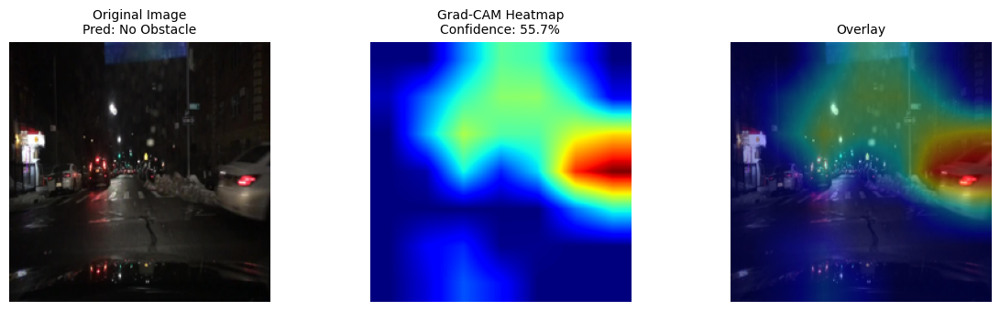

In [24]:
GradCAM.inspect_single_df(
    df=uncertain_df,
    df_name="Uncertain Predictions",
    model=model,
    model_name = "efficientnet_b0",
    device=device,
    num_samples=5
)

In [34]:
print("Uncertain Obstacle:", len(uncertain_obstacle_df))
print("Uncertain No Obstacle:", len(uncertain_no_obstacle_df))

Uncertain Obstacle: 4
Uncertain No Obstacle: 9


## **Uncertain Obstacle**

GRAD-CAM INSPECTION: UNCERTAIN OBSTACLE (4 images)


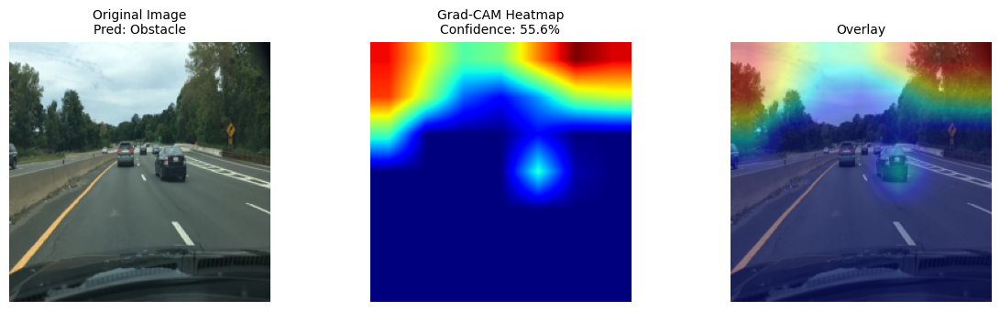

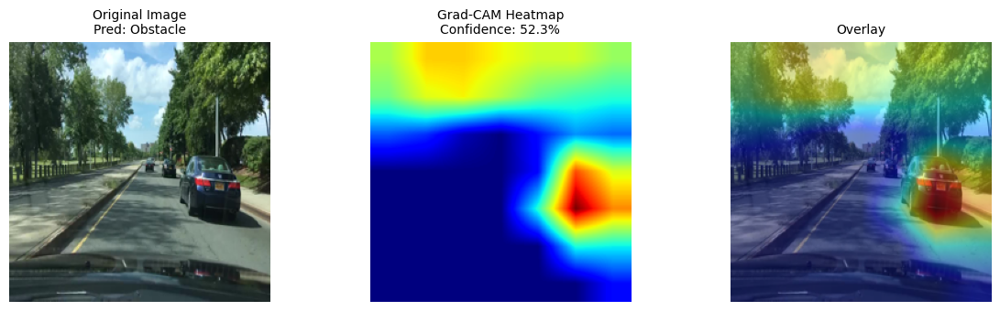

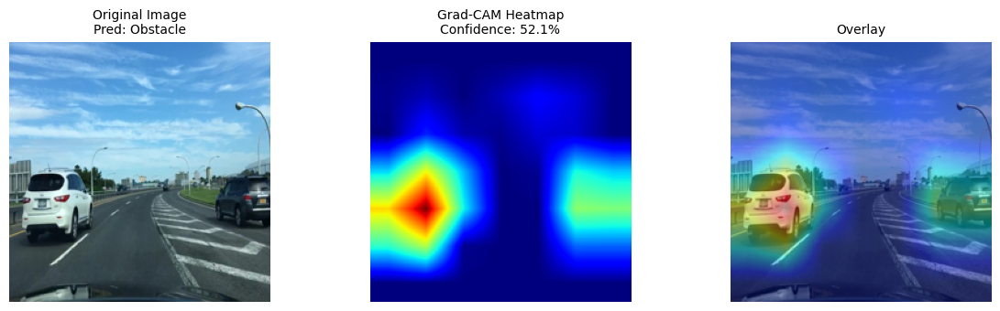

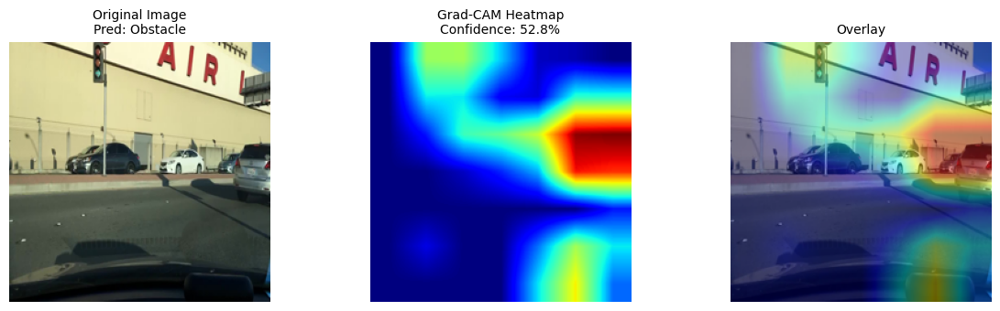

In [30]:
uncertain_obstacle_df = predictions_df[(predictions_df["pred_label"] == 1) &(predictions_df["is_uncertain"])]

GradCAM.inspect_single_df(
    df=uncertain_obstacle_df,
    df_name="Uncertain Obstacle",
    model=model,
    model_name="efficientnet_b0",
    device=device,
    num_samples=4
)

These examples correspond to obstacle predictions where the model has relatively low confidence. Grad-CAM is used to investigate whether the uncertainty is associated with ambiguous visual features, partially visible obstacles, or competing regions within the scene.

The activation patterns provide insight into which regions contribute to the model's uncertainty in these difficult cases.

## **Uncertain NO Obstacle**

GRAD-CAM INSPECTION: UNCERTAIN NO OBSTACLE (9 images)


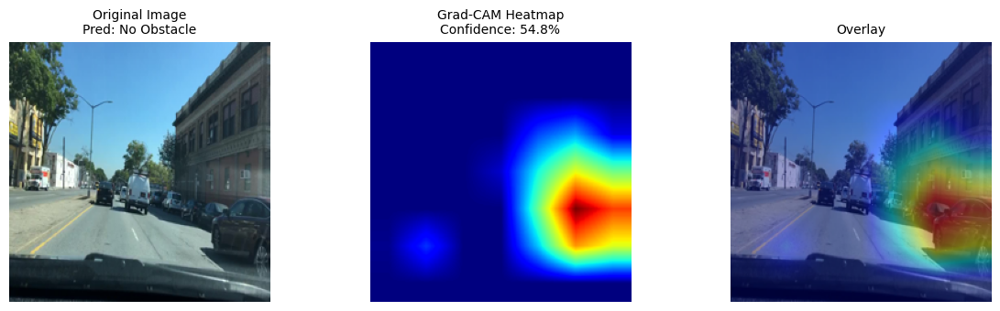

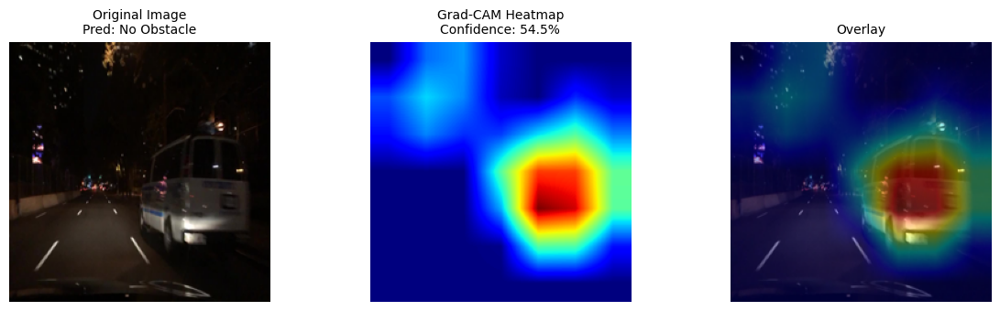

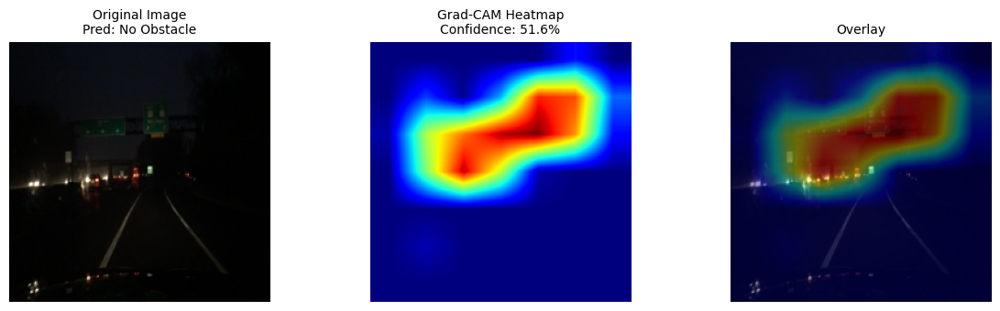

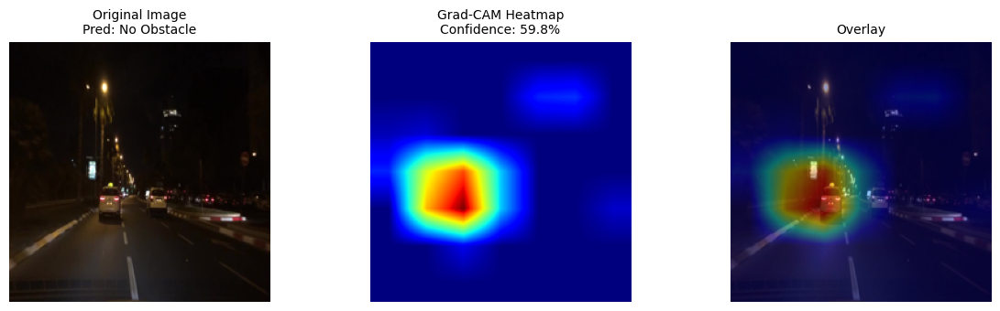

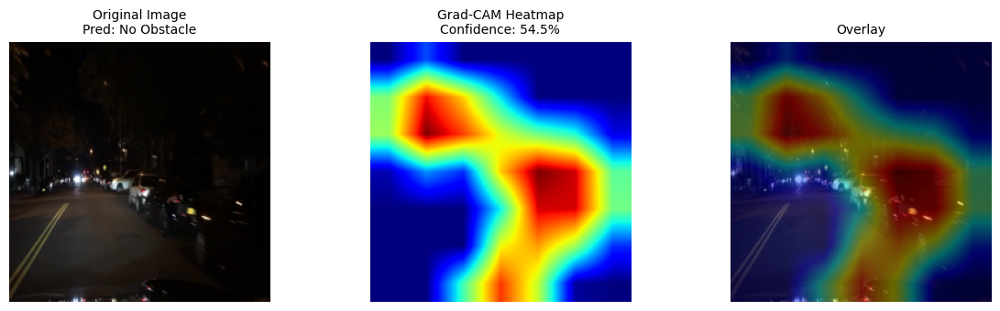

In [32]:
uncertain_no_obstacle_df = predictions_df[(predictions_df["pred_label"]==0) & (predictions_df["is_uncertain"])]
GradCAM.inspect_single_df(
    df=uncertain_no_obstacle_df,
    df_name="Uncertain NO Obstacle",
    model=model,
    model_name="efficientnet_b0",
    device=device,
    num_samples=5
)


The Grad-CAM visualizations are examined for no-obstacle predictions with relatively low confidence.

These examples help identify scenes where the visual information may be ambiguous, causing the model to distribute its attention across multiple regions rather than strongly focusing on a single relevant feature.

### False Positives and False Negatives

In [35]:
print(inference_df.columns)
print(predictions_df.columns)

Index(['image_path', 'image_name', 'label', 'label_encoded'], dtype='object')
Index(['image_path', 'image_name', 'raw_logit', 'raw_prob', 'pred_label',
       'pred_class_name', 'confidence_score', 'is_uncertain'],
      dtype='object')


In [36]:
combined_df = inference_df.merge(
    predictions_df,
    on="image_name",
    how="inner",
    suffixes=("_true", "_pred")
)

In [37]:
print(f"Inference images: {len(inference_df):,}")
print(f"Predictions: {len(predictions_df):,}")
print(f"Combined: {len(combined_df):,}")

Inference images: 514
Predictions: 514
Combined: 514


In [38]:
combined_df["image_path"] = combined_df["image_path_true"]

In [39]:
combined_df.head(4)

,image_path_true,image_name,label,label_encoded,image_path_pred,raw_logit,raw_prob,pred_label,pred_class_name,confidence_score,is_uncertain,image_path
0,/kaggle/input/datasets/gracyyadav79/data-2k-50...,9bc0e5c8-0cb9683d.jpg,Obstacle,1,/kaggle/input/datasets/gracyyadav79/data-2k-50...,22.3425,1.0,1,Obstacle,100.0,False,/kaggle/input/datasets/gracyyadav79/data-2k-50...
1,/kaggle/input/datasets/gracyyadav79/data-2k-50...,b7226661-33b4c4ff.jpg,Obstacle,1,/kaggle/input/datasets/gracyyadav79/data-2k-50...,13.5993,1.0,1,Obstacle,100.0,False,/kaggle/input/datasets/gracyyadav79/data-2k-50...
2,/kaggle/input/datasets/gracyyadav79/data-2k-50...,c6728701-f427d429.jpg,Obstacle,1,/kaggle/input/datasets/gracyyadav79/data-2k-50...,10.2992,1.0,1,Obstacle,100.0,False,/kaggle/input/datasets/gracyyadav79/data-2k-50...
3,/kaggle/input/datasets/gracyyadav79/data-2k-50...,a279854d-162bd02c.jpg,Obstacle,1,/kaggle/input/datasets/gracyyadav79/data-2k-50...,21.8656,1.0,1,Obstacle,100.0,False,/kaggle/input/datasets/gracyyadav79/data-2k-50...


In [40]:
combined_df["label_encoded"].value_counts()

label_encoded
1    324
0    190
Name: count, dtype: int64

In [41]:
combined_df["pred_label"].value_counts()

pred_label
1    318
0    196
Name: count, dtype: int64

In [42]:
fp_df = combined_df [(combined_df["label_encoded"]==0)&(combined_df["pred_label"]==1)]
fn_df = combined_df[(combined_df["label_encoded"]==1)&(combined_df["pred_label"]==0)]

In [43]:
print(f"False Positives: {len(fp_df)}")
print(f"False Negatives: {len(fn_df)}")

False Positives: 29
False Negatives: 35


## **False Positive Analysis**

GRAD-CAM INSPECTION: FALSE POSITIVES (29 images)


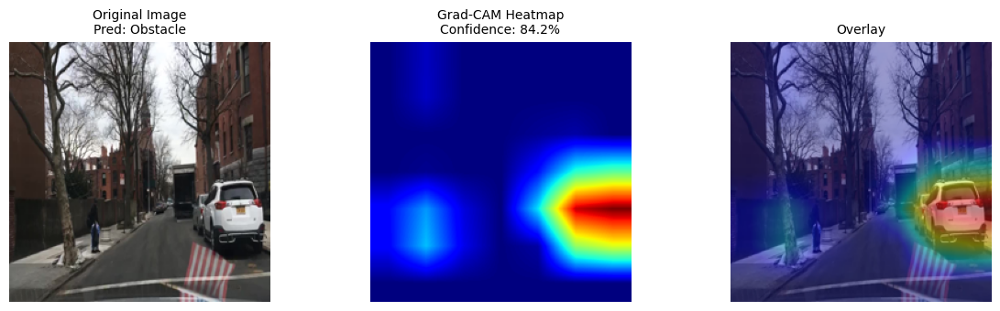

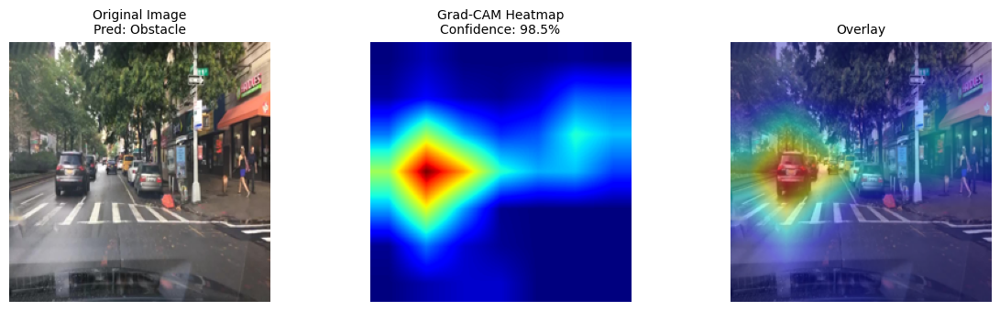

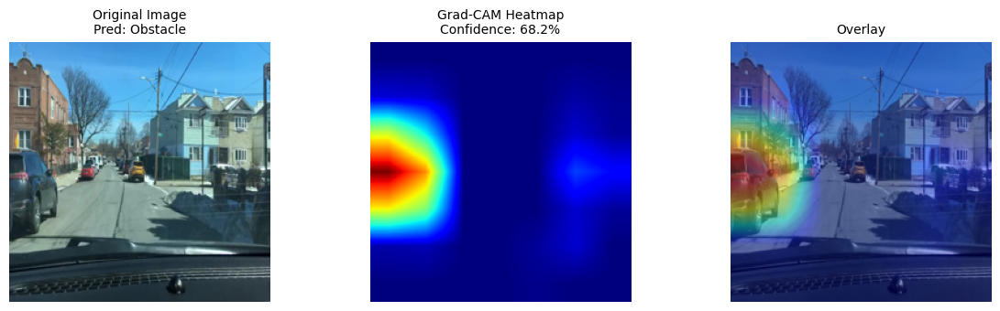

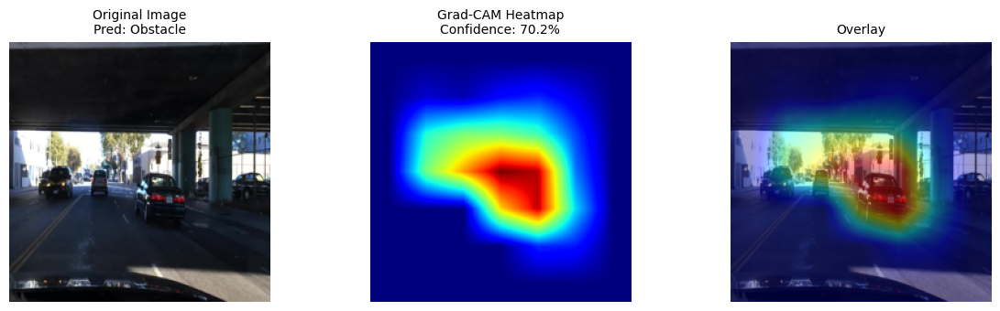

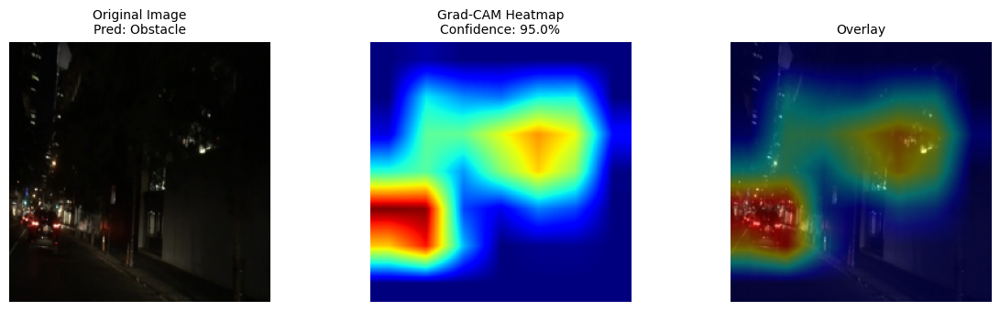

In [45]:
GradCAM.inspect_single_df(
    df=fp_df,
    df_name="False Positives",
    model=model,
    model_name="efficientnet_b0",
    device=device,
    num_samples=5
)



False positives are images where the ground-truth class is No Obstacle but the model predicts Obstacle.

Grad-CAM is used to investigate which image regions contributed to these incorrect predictions. Examining these cases helps identify visual patterns that may cause the model to incorrectly interpret non-obstacle regions as obstacles.

## **False Negatives**

GRAD-CAM INSPECTION: FALSE NEGATIVES (35 images)


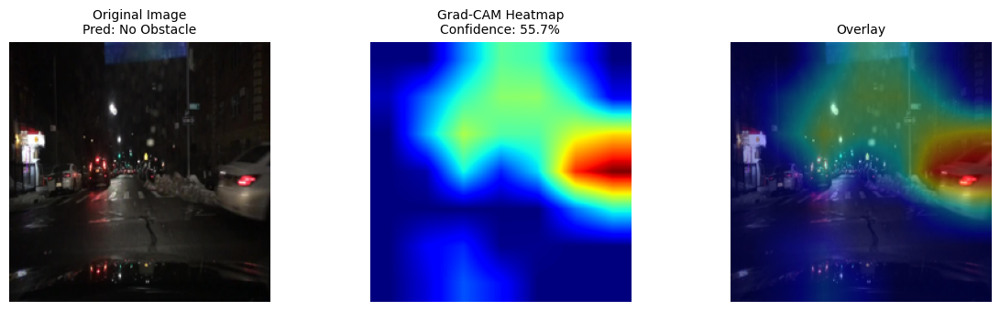

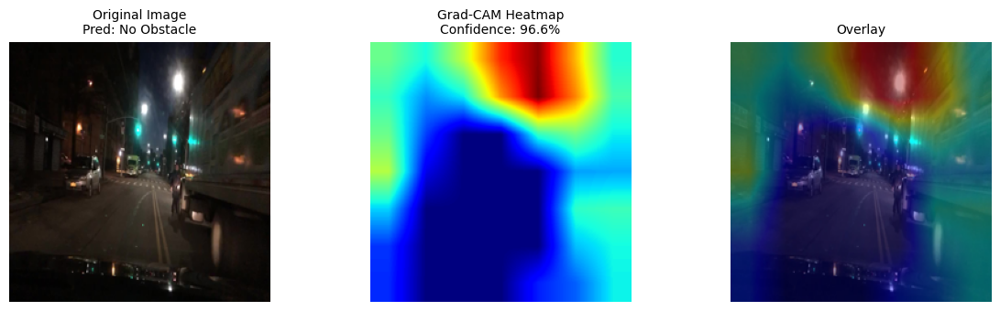

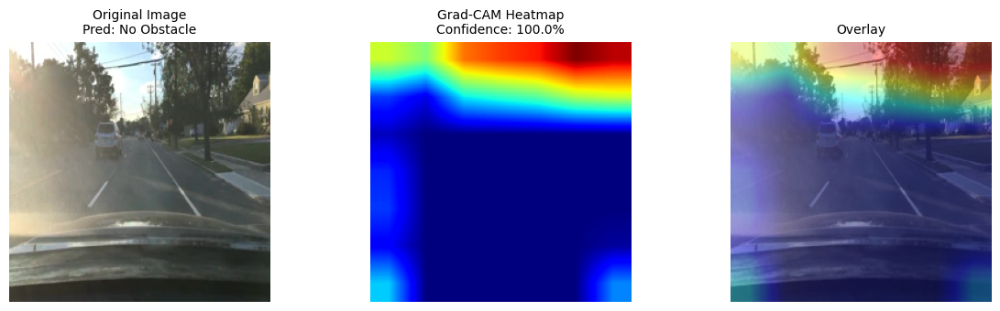

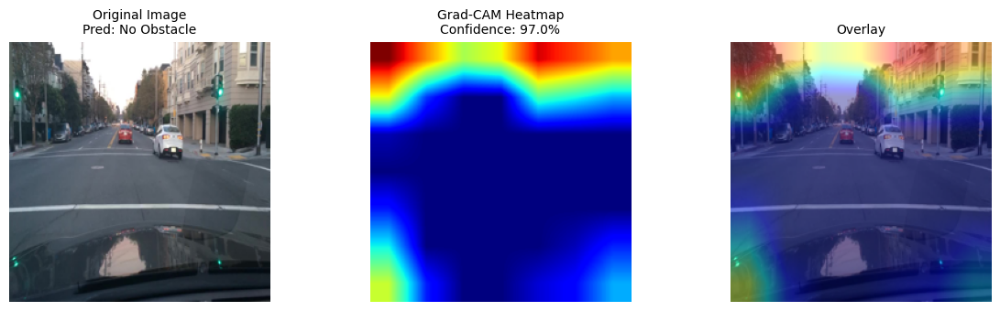

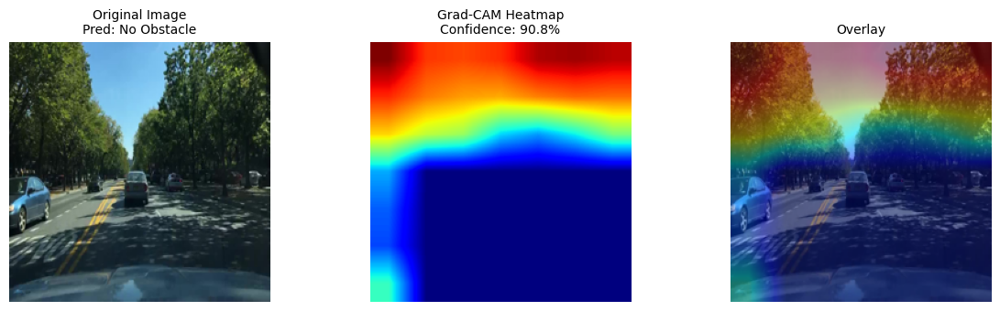

In [46]:
GradCAM.inspect_single_df(
    df=fn_df,
    df_name="False Negatives",
    model=model,
    model_name="efficientnet_b0",
    device=device,
    num_samples=5
)

False negatives are images where the ground-truth class is Obstacle but the model predicts No Obstacle.

Grad-CAM is used to examine whether the model fails to focus on the relevant obstacle regions or whether the obstacles themselves are visually difficult to distinguish from the surrounding scene.

## Overall Grad-CAM Analysis

Grad-CAM was used to examine the visual regions contributing to the EfficientNet-B0 predictions across high-confidence, uncertain, false-positive, and false-negative examples.

The high-confidence examples provide insight into the features used for successful predictions, while the uncertain and misclassified examples help identify cases where the model's attention may be ambiguous or focused on less relevant regions.

Overall, the Grad-CAM analysis provides an additional qualitative evaluation of the selected model and helps assess whether its predictions are supported by meaningful visual features.